# EDA PROJECT

#  Suicide Rate Analysis 1985-2016

**Introduction**

"Suicide is a significant global issue. Understanding it is crucial. This analysis examines suicide rates, considering factors like age and location. The goal is to uncover reasons behind suicide and develop prevention strategies. The analysis contributes to promoting better mental health and a kinder, more supportive society."

# 1.Import Libraries📚

In [1]:
import pandas as pd
import numpy as np
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import seaborn as sns
import matplotlib.pyplot as plt

%matplotlib inline  
sns.set(rc={'figure.figsize': [11, 4]}, font_scale=0.7)

# **2.Data exploration💾**

In [2]:
df = pd.read_csv('Suicide rate.csv')
df.head(5)

,country,year,sex,age,suicides_no,population,suicides/100k pop,country-year,HDI for year,gdp_for_year ($),gdp_per_capita ($),generation
0,Albania,1987,male,15-24 years,21,312900,6.71,Albania1987,NaN,"2,156,624,900",796,Generation X
1,Albania,1987,male,35-54 years,16,308000,5.19,Albania1987,NaN,"2,156,624,900",796,Silent
2,Albania,1987,female,15-24 years,14,289700,4.83,Albania1987,NaN,"2,156,624,900",796,Generation X
3,Albania,1987,male,75+ years,1,21800,4.59,Albania1987,NaN,"2,156,624,900",796,G.I. Generation
4,Albania,1987,male,25-34 years,9,274300,3.28,Albania1987,NaN,"2,156,624,900",796,Boomers


**Feature Names and Descriptions**

**country : The name of the country where the data is recorded.**

**year : The year in which the data is recorded.**

**sex : The gender (male or female) for which the data is reported.**

**age : The age group to which the data corresponds.**

**suicides_no : The number of suicides reported for a specific group.**

**population : The population count for a specific group.**

**suicides/100k pop : The number of suicides per 100,000 population.**

**HDI for year : The Human Development Index value for a specific year.**

**gdp for year : The gross domestic product (GDP) for a specific year.**

**gdp per capita : The GDP per capita, representing the economic output per person.**

**generation : The generational group to which individuals belong.**

In [3]:
# check the dataset shape
print("Number of Columns in data",df.shape[1])
print("---------------------------------------")
print("Number of Rows in data",df.shape[0])
df.shape

Number of Columns in data 12
---------------------------------------
Number of Rows in data 27820


(27820, 12)

In [4]:
# data information
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27820 entries, 0 to 27819
Data columns (total 12 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   country             27820 non-null  object 
 1   year                27820 non-null  int64  
 2   sex                 27820 non-null  object 
 3   age                 27820 non-null  object 
 4   suicides_no         27820 non-null  int64  
 5   population          27820 non-null  int64  
 6   suicides/100k pop   27820 non-null  float64
 7   country-year        27820 non-null  object 
 8   HDI for year        8364 non-null   float64
 9    gdp_for_year ($)   27820 non-null  object 
 10  gdp_per_capita ($)  27820 non-null  int64  
 11  generation          27820 non-null  object 
dtypes: float64(2), int64(4), object(6)
memory usage: 2.5+ MB


In [5]:
df.nunique()

country                 101
year                     32
sex                       2
age                       6
suicides_no            2084
population            25564
suicides/100k pop      5298
country-year           2321
HDI for year            305
 gdp_for_year ($)      2321
gdp_per_capita ($)     2233
generation                6
dtype: int64

**gdp_for_year needed to be converted to Integer type.**

**gdp_for_year column name needed to be fixed by removing the space at the beginning.**

**country-year column should be dropped from the dataset.**

In [6]:
# dropping the 'country-year' column since it is the combination of country and year columns
df.drop('country-year', axis=1, inplace=True)

In [7]:
# Checking to see if the 'country-year' column has been deleted
df.head()

,country,year,sex,age,suicides_no,population,suicides/100k pop,HDI for year,gdp_for_year ($),gdp_per_capita ($),generation
0,Albania,1987,male,15-24 years,21,312900,6.71,NaN,"2,156,624,900",796,Generation X
1,Albania,1987,male,35-54 years,16,308000,5.19,NaN,"2,156,624,900",796,Silent
2,Albania,1987,female,15-24 years,14,289700,4.83,NaN,"2,156,624,900",796,Generation X
3,Albania,1987,male,75+ years,1,21800,4.59,NaN,"2,156,624,900",796,G.I. Generation
4,Albania,1987,male,25-34 years,9,274300,3.28,NaN,"2,156,624,900",796,Boomers


In [8]:
# Making column names better by putting underscores between words and fixing 'gdp_for_year' by taking out the space at the beginning.
df.columns = df.columns.str.strip().str.replace(' ','_')

In [9]:
# Checking to see if the underscores has been added to the columns and if gdp_for_year has been fixed.
df.columns

Index(['country', 'year', 'sex', 'age', 'suicides_no', 'population',
       'suicides/100k_pop', 'HDI_for_year', 'gdp_for_year_($)',
       'gdp_per_capita_($)', 'generation'],
      dtype='object')

In [10]:
# checking for missing values in data
df.isna().sum()

country                   0
year                      0
sex                       0
age                       0
suicides_no               0
population                0
suicides/100k_pop         0
HDI_for_year          19456
gdp_for_year_($)          0
gdp_per_capita_($)        0
generation                0
dtype: int64

**HDI_for_year column has significant amount of missing data and should be dropped**

In [11]:
# checking for duplicated values
df.duplicated().sum()

0

**Data does not contain any duplicated values**

In [12]:
# checking count the number of unique values in each column of the data
df.nunique()

country                 101
year                     32
sex                       2
age                       6
suicides_no            2084
population            25564
suicides/100k_pop      5298
HDI_for_year            305
gdp_for_year_($)       2321
gdp_per_capita_($)     2233
generation                6
dtype: int64

In [13]:
# Descriptive analysis for numerical data
df.describe()

,year,suicides_no,population,suicides/100k_pop,HDI_for_year,gdp_per_capita_($)
count,27820.000000,27820.000000,2.782000e+04,27820.000000,8364.000000,27820.000000
mean,2001.258375,242.574407,1.844794e+06,12.816097,0.776601,16866.464414
std,8.469055,902.047917,3.911779e+06,18.961511,0.093367,18887.576472
min,1985.000000,0.000000,2.780000e+02,0.000000,0.483000,251.000000
25%,1995.000000,3.000000,9.749850e+04,0.920000,0.713000,3447.000000
50%,2002.000000,25.000000,4.301500e+05,5.990000,0.779000,9372.000000
75%,2008.000000,131.000000,1.486143e+06,16.620000,0.855000,24874.000000
max,2016.000000,22338.000000,4.380521e+07,224.970000,0.944000,126352.000000


In [14]:
# Descriptive analysis for categorical data
df.describe(include='O')

,country,sex,age,gdp_for_year_($),generation
count,27820,27820,27820,27820,27820
unique,101,2,6,2321,6
top,Mauritius,male,15-24 years,"2,156,624,900",Generation X
freq,382,13910,4642,12,6408


# **3.Data Preprocessing⚒️**

**3.1 Handling Missing values**

In [15]:
df.isna().sum() / df.shape[0]*100

country                0.000000
year                   0.000000
sex                    0.000000
age                    0.000000
suicides_no            0.000000
population             0.000000
suicides/100k_pop      0.000000
HDI_for_year          69.935298
gdp_for_year_($)       0.000000
gdp_per_capita_($)     0.000000
generation             0.000000
dtype: float64

In [16]:
# Dropping 'HDI_for_year' column due to significant missing data of approximately 70%.
df.drop('HDI_for_year', axis=1, inplace=True)

In [17]:
# Checking to see if the 'HDI_for_year' column has been deleted 
df.isna().sum() 

country               0
year                  0
sex                   0
age                   0
suicides_no           0
population            0
suicides/100k_pop     0
gdp_for_year_($)      0
gdp_per_capita_($)    0
generation            0
dtype: int64

**Now The dataset doesn't have any missing data.**

**3.2- Creating New Feature**

**generation_birth_year_range: represents the birth year ranges associated with different generational groups**

In [18]:
replace_name = {
    'Millenials': 'Millennials',  # Correct the spelling
    'Boomers': 'Baby Boomers'  # Replace "Boomers" with "Baby Boomers"
}

In [19]:
df['generation'] = df['generation'].replace(replace_name)

In [20]:
def generation_birth_year_range(generation):
    if generation == 'G.I. Generation':
        return '1900-1924'
    elif generation == 'Silent':
        return '1925-1944'
    elif generation == 'Baby Boomers':
        return '1945-1964'
    elif generation == 'Generation X':
        return '1965-1980'
    elif generation == 'Millennials':
        return '1981-1996'
    elif generation == 'Generation Z':
        return '1997-2010'
    else:
        return 'Unknown'

In [21]:
df['generation_birth_year_range'] = df['generation'].apply(generation_birth_year_range)

In [22]:
df['generation_birth_year_range'].unique()

array(['1965-1980', '1925-1944', '1900-1924', '1945-1964', '1981-1996',
       '1997-2010'], dtype=object)

In [23]:
# checking if generation_birth_year_range columns is added to the dataset
df.head()

,country,year,sex,age,suicides_no,population,suicides/100k_pop,gdp_for_year_($),gdp_per_capita_($),generation,generation_birth_year_range
0,Albania,1987,male,15-24 years,21,312900,6.71,"2,156,624,900",796,Generation X,1965-1980
1,Albania,1987,male,35-54 years,16,308000,5.19,"2,156,624,900",796,Silent,1925-1944
2,Albania,1987,female,15-24 years,14,289700,4.83,"2,156,624,900",796,Generation X,1965-1980
3,Albania,1987,male,75+ years,1,21800,4.59,"2,156,624,900",796,G.I. Generation,1900-1924
4,Albania,1987,male,25-34 years,9,274300,3.28,"2,156,624,900",796,Baby Boomers,1945-1964


 **3.3Feature-Repairing**

In [24]:
# Fixing 'gdp_for_year' feature: removing commas to convert the values to numeric format
df['gdp_for_year_($)'] = df['gdp_for_year_($)'].apply(lambda x: int(x.replace(',', '')))

In [25]:
# checking if gdp_for_year has been converted to numeric format
df['gdp_for_year_($)'].dtypes

dtype('int64')

In [26]:
# Updated Descriptive analysis for numerical data
df.describe()

,year,suicides_no,population,suicides/100k_pop,gdp_for_year_($),gdp_per_capita_($)
count,27820.000000,27820.000000,2.782000e+04,27820.000000,2.782000e+04,27820.000000
mean,2001.258375,242.574407,1.844794e+06,12.816097,4.455810e+11,16866.464414
std,8.469055,902.047917,3.911779e+06,18.961511,1.453610e+12,18887.576472
min,1985.000000,0.000000,2.780000e+02,0.000000,4.691962e+07,251.000000
25%,1995.000000,3.000000,9.749850e+04,0.920000,8.985353e+09,3447.000000
50%,2002.000000,25.000000,4.301500e+05,5.990000,4.811469e+10,9372.000000
75%,2008.000000,131.000000,1.486143e+06,16.620000,2.602024e+11,24874.000000
max,2016.000000,22338.000000,4.380521e+07,224.970000,1.812071e+13,126352.000000


**3.4 Relation Between columns**

**Covarience matix**

In [27]:
suicides = df['suicides_no']
population = df['population']
cov_matrix = np.cov(suicides, population, bias=True)
cov_XY = cov_matrix[0, 1]

print(f"Covariance between Suicides  and population: {cov_XY}")

Covariance between Suicides  and population: 2174119724.747806


**Pearson Corelation**

In [28]:
corr_coefficient = np.corrcoef(suicides, population)[0, 1]
print(f"Pearson Correlation between suicides and population: {corr_coefficient}")

Pearson Correlation between suicides and population: 0.6161622675219282


**CoVarience and corelation**

In [29]:
import numpy as np
from scipy.stats import pearsonr
cov_matrix = np.cov(suicides, population, bias=True)
cov_XY = cov_matrix[0, 1]
corr_coefficient, _ = pearsonr(suicides, population)
print(f"Covariance between suicides and population: {cov_XY}")
print(f"Pearson Correlation between suicides and population: {corr_coefficient}")

Covariance between suicides and population: 2174119724.747806
Pearson Correlation between suicides and population: 0.6161622675219284


**Spearman Rank Corelation**

In [30]:
from scipy.stats import spearmanr
rho, p_value = spearmanr(suicides, population)
print(f"Spearman Rank Correlation (rho): {rho}")

Spearman Rank Correlation (rho): 0.7755801321680985


# 4.Exploratory Data Ananlysis📊

**4.1 Univariate Analysis**

**Exploration (Country) Feature**

In [31]:
df['country'].unique()

array(['Albania', 'Antigua and Barbuda', 'Argentina', 'Armenia', 'Aruba',
       'Australia', 'Austria', 'Azerbaijan', 'Bahamas', 'Bahrain',
       'Barbados', 'Belarus', 'Belgium', 'Belize',
       'Bosnia and Herzegovina', 'Brazil', 'Bulgaria', 'Cabo Verde',
       'Canada', 'Chile', 'Colombia', 'Costa Rica', 'Croatia', 'Cuba',
       'Cyprus', 'Czech Republic', 'Denmark', 'Dominica', 'Ecuador',
       'El Salvador', 'Estonia', 'Fiji', 'Finland', 'France', 'Georgia',
       'Germany', 'Greece', 'Grenada', 'Guatemala', 'Guyana', 'Hungary',
       'Iceland', 'Ireland', 'Israel', 'Italy', 'Jamaica', 'Japan',
       'Kazakhstan', 'Kiribati', 'Kuwait', 'Kyrgyzstan', 'Latvia',
       'Lithuania', 'Luxembourg', 'Macau', 'Maldives', 'Malta',
       'Mauritius', 'Mexico', 'Mongolia', 'Montenegro', 'Netherlands',
       'New Zealand', 'Nicaragua', 'Norway', 'Oman', 'Panama', 'Paraguay',
       'Philippines', 'Poland', 'Portugal', 'Puerto Rico', 'Qatar',
       'Republic of Korea', 'Romania', '

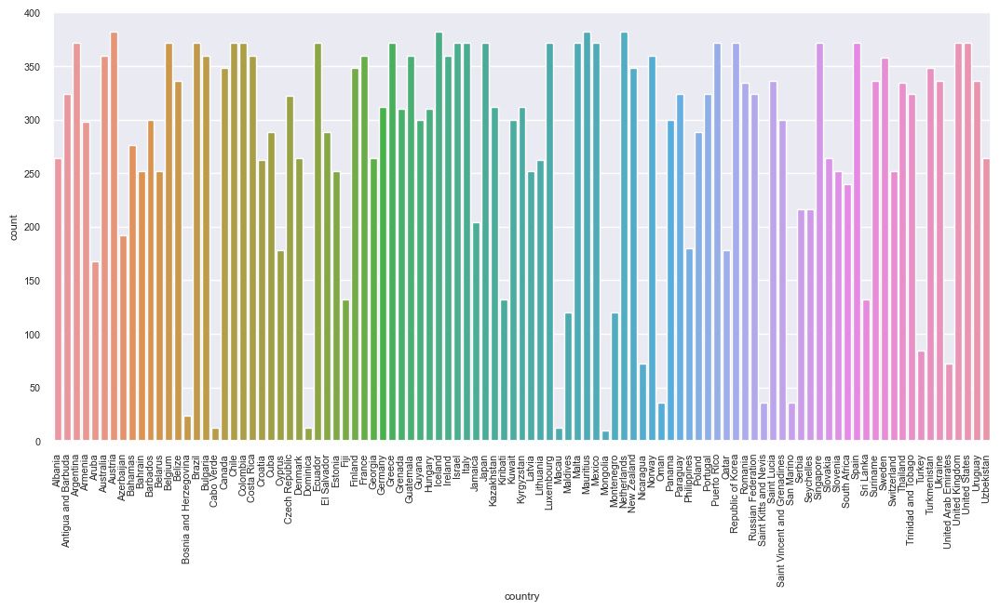

In [32]:
plt.figure(figsize=(13, 6))
sns.countplot(data=df, x='country')
plt.xticks(rotation=90)
plt.show()

**Exploration (Year) Feature**

In [33]:
df['year'].unique()

array([1987, 1988, 1989, 1992, 1993, 1994, 1995, 1996, 1997, 1998, 1999,
       2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010,
       1985, 1986, 1990, 1991, 2012, 2013, 2014, 2015, 2011, 2016],
      dtype=int64)

<Axes: xlabel='year', ylabel='count'>

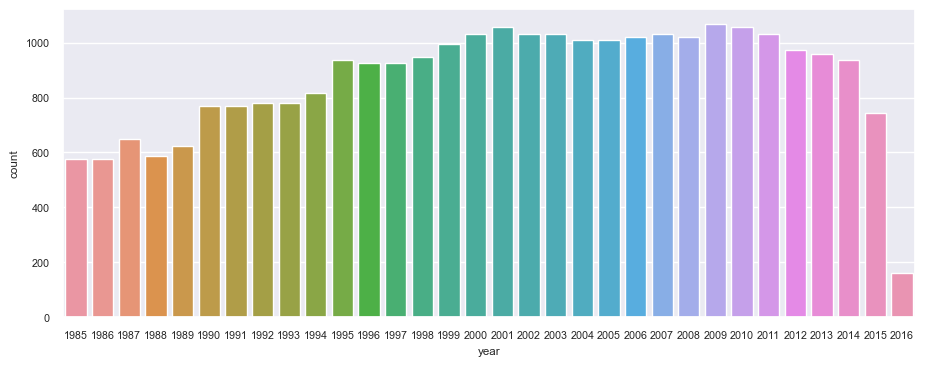

In [34]:
sns.countplot(data=df,x=df['year'])

**Exploration (Sex) Feature**

In [35]:
df['sex'].unique()

array(['male', 'female'], dtype=object)

<Axes: xlabel='sex', ylabel='count'>

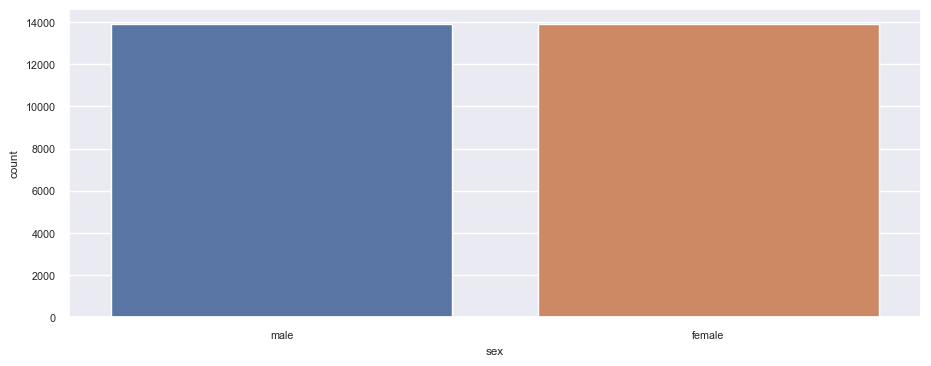

In [36]:
sns.countplot(data=df,x=df['sex'])

**Exploration (Age) Feature**

In [37]:
df['age'].unique()

array(['15-24 years', '35-54 years', '75+ years', '25-34 years',
       '55-74 years', '5-14 years'], dtype=object)

<Axes: xlabel='age', ylabel='count'>

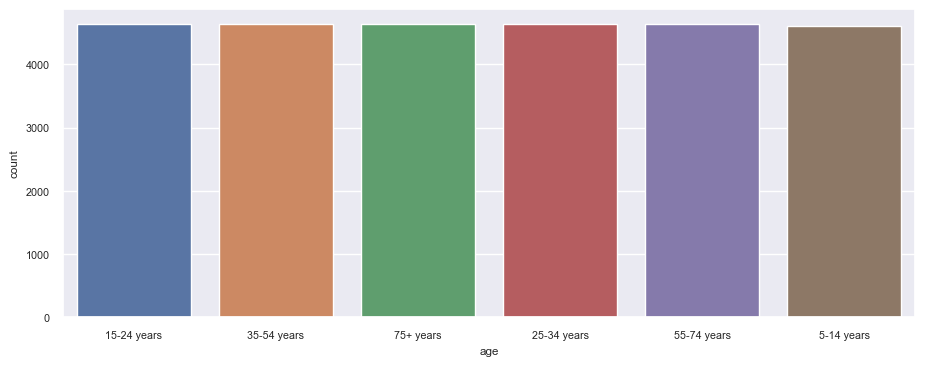

In [38]:
sns.countplot(data=df,x=df['age'])

**Exploration (Generation Birth Year Range) Feature**

In [39]:
df['generation_birth_year_range'].unique()

array(['1965-1980', '1925-1944', '1900-1924', '1945-1964', '1981-1996',
       '1997-2010'], dtype=object)

<Axes: xlabel='generation_birth_year_range', ylabel='count'>

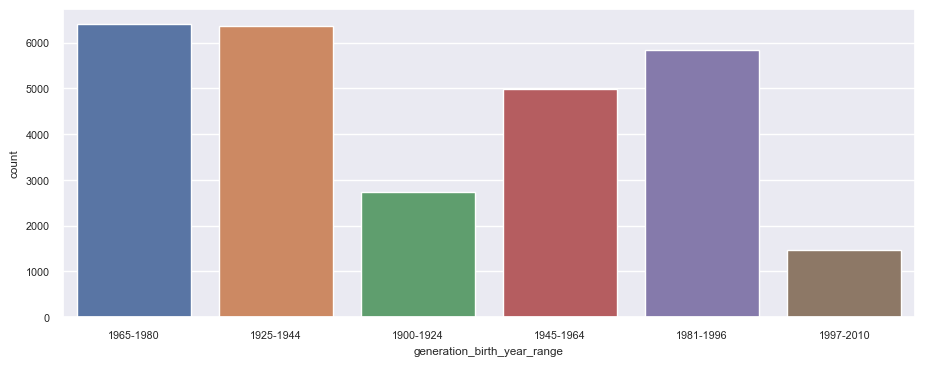

In [40]:
sns.countplot(data=df,x=df['generation_birth_year_range'])

**Exploration (Generation) Feature**

In [41]:
df['generation'].unique()

array(['Generation X', 'Silent', 'G.I. Generation', 'Baby Boomers',
       'Millennials', 'Generation Z'], dtype=object)

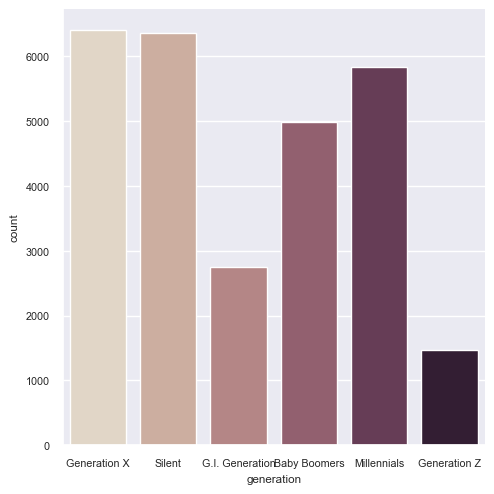

In [42]:
sns.catplot(data=df, x="generation", kind="count", palette="ch:.25")

**Exploration (Suicides no, Population, Suicides/100k pop, GDP for Year, GDP per Capita) Features**

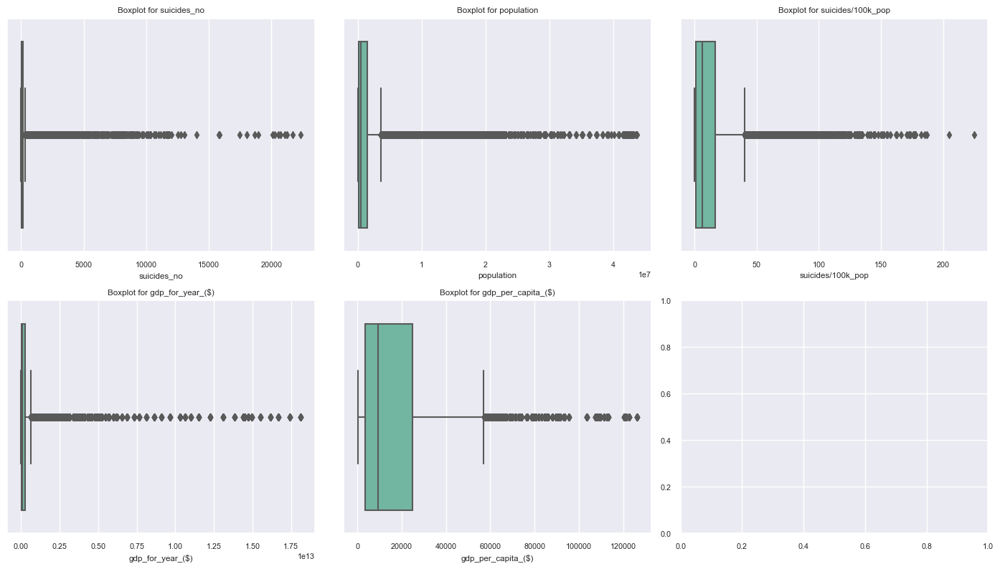

In [43]:
fig, axes = plt.subplots(2, 3, figsize=(14, 8))

num_features = ['suicides_no', 'population', 'suicides/100k_pop', 'gdp_for_year_($)', 'gdp_per_capita_($)']

for i, ax in enumerate(axes.flat):
    if i < len(num_features):
        sns.boxplot(data=df, x=num_features[i], ax=ax, palette='Set2', orient='h')
        ax.set_title(f'Boxplot for {num_features[i]}')
        ax.set_yticklabels([]) 

plt.tight_layout()

plt.show()

**Observation of Univariate Analysis**

**1.Outliers Exist: Outliers were detected in every numeric column of the dataset during the examination.**

**2.Contextual Significance: These outliers are not anomalies or incorrect data points but are in alignment with the overall trends and patterns observed in the dataset.**

**3.Categorical Features: The dataset's categorical features, such as age, country, and sex, exhibit a relatively balanced distribution across their variables, indicating that the presence of outliers does not indicate data quality issues.**

**4.2- Bivariate Analysis**

**Correlation Features Summary**

In [44]:
cols = ['suicides_no', 'population', 'suicides/100k_pop',
        'gdp_for_year_($)', 'gdp_per_capita_($)']

correlation_matrix = df[cols].corr()

fig = px.imshow(correlation_matrix, text_auto=True)

fig.update_layout(title="Correlation Matrix",
                  xaxis=dict(title="Columns"),
                  yaxis=dict(title="Columns"))
fig.show()

**Total Number of Suicides by Year**

In [45]:
data_country = df.groupby('year')["suicides_no"].sum().reset_index()

fig_country = px.line(data_country, x="year", y="suicides_no",
                      title="Total Number of Suicides by Year")

fig_country.update_traces(line=dict(color='blue', width=2))  
fig_country.update_xaxes(title="Year", showgrid=True, gridcolor='lightgray')  
fig_country.update_yaxes(title="Suicide no", showgrid=True, gridcolor='lightgray')  
fig_country.update_layout(title_font=dict(size=24), title_x=0.5)  
fig_country.update_layout(plot_bgcolor='white') 
fig_country.update_layout(legend_title_text='Legend')  
fig_country.update_layout(legend=dict(orientation='h', y=1.1)) 
fig_country.update_layout(template="plotly") 

fig_country.show()


**A)Suicides showed a significant increase starting in 1988.**

**B)High suicide rates persisted until 2014.**

**C)Notably, a decline in suicides occurred in 2015.**

**D)This drop may be linked to data gaps, particularly in the year 2016.**


**  **

**GDP for Year vs. Suicide Rate per 100k Population**

In [46]:
data_GDP_suicide_rate = df.groupby("suicides/100k_pop").agg({
    "gdp_for_year_($)": "mean"
}).reset_index()

fig = px.scatter(data_GDP_suicide_rate, x='suicides/100k_pop', y="gdp_for_year_($)")

fig.update_traces(marker=dict(size=10, opacity=0.7, line=dict(width=2, color='darkblue')))  
fig.update_xaxes(title_text="Suicide Rate per 100k Population", showgrid=True, gridcolor='lightgray')
fig.update_yaxes(title_text="GDP for Year ($)", showgrid=True, gridcolor='lightgray')
fig.update_layout(title="GDP for Year vs. Suicide Rate per 100k Population",
                  title_font=dict(size=24), title_x=0.5, title_y=0.95)
fig.update_layout(plot_bgcolor='white', paper_bgcolor='white')
fig.update_layout(legend_title_text='Legend')
fig.update_layout(legend=dict(orientation='h', y=1.1))
fig.update_layout(template="plotly")

fig.show()

**A)There is a weak positive correlation between annual GDP and suicide rates.**

**B)As GDP for Year increases, there is a slight tendency for suicide rates to rise.**

**C)However, this correlation is not practically meaningful, as multiple other factors play a more significant role in influencing suicide rates.**

****

**GDP per Capita vs. Suicide Rate per 100k Population**

In [47]:
data_GDP_suicide_rate = df.groupby("suicides/100k_pop").agg({
    "gdp_per_capita_($)": "mean"
}).reset_index()

fig = px.scatter(data_GDP_suicide_rate, x='suicides/100k_pop', y="gdp_per_capita_($)")

fig.update_traces(marker=dict(size=10, opacity=0.7, line=dict(width=2, color='darkblue')))  
fig.update_xaxes(title_text="Suicide Rate per 100k Population", showgrid=True, gridcolor='lightgray')
fig.update_yaxes(title_text="GDP per Capita ($)", showgrid=True, gridcolor='lightgray')
fig.update_layout(title="GDP per Capita vs. Suicide Rate per 100k Population",
                  title_font=dict(size=24), title_x=0.5, title_y=0.95)
fig.update_layout(plot_bgcolor='white', paper_bgcolor='white')
fig.update_layout(legend_title_text='Legend')
fig.update_layout(legend=dict(orientation='h', y=1.1))
fig.update_layout(template="plotly")

fig.show()

**A)An extremely weak positive correlation exists between GDP per capita and suicide rates.**

**B)When GDP per capita increases, there's a slight tendency for suicide rates to also rise.**

**C)However, this correlation is so feeble that it lacks practical significance.**

**D)Many other factors have a more substantial influence on suicide rates, and this correlation does not imply a meaningful cause-and-effect relationship**

****

**4.3- Multivariate Analysis**

**Suicide Rates by Country**

In [48]:
suicide_age_data = df.groupby('country').agg({
    'suicides/100k_pop': 'mean'
}).reset_index().sort_values(by='suicides/100k_pop')

fig = px.bar(suicide_age_data, x='suicides/100k_pop', y='country',
             title='Suicide Rates by Country', color='suicides/100k_pop',
             labels={'suicides_rate': 'Average Suicide Rate'},
             height=1600, width=900, orientation='h', 
             template='plotly_white', opacity=0.7
            )

fig.update_traces(marker=dict(line=dict(width=2, color='darkgray')))
fig.update_xaxes(title_text='Average Suicide Rate', showgrid=True, gridcolor='lightgray', zeroline=False)
fig.update_yaxes(title_text='', showgrid=False)
fig.update_layout(title_font=dict(size=24), title_x=0.5, title_y=0.95)
fig.update_layout(plot_bgcolor='white', paper_bgcolor='white')
fig.update_layout(legend_title_text='Legend', legend=dict(orientation='h', y=1.1))
fig.update_layout(xaxis_tickangle=-45)  

fig.show()

**A)Lithuania exhibits the highest suicide rate, followed by Sri Lanka and the Russian Federation.**

**B)These elevated rates may be attributed to various factors, including historical conflicts, diplomatic tensions, or governance-related issues.**

**Suicide Rate by Country Over the Years Map**

In [49]:
df_sorted = df.sort_values(by="year")

fig = px.choropleth(df_sorted, 
                    locations="country", 
                    locationmode="country names",  
                    color="suicides/100k_pop",  
                    hover_name="country",  
                    animation_frame="year",  
                    color_continuous_scale=px.colors.sequential.Plasma,  
                    projection="natural earth")

fig.update_geos(showcoastlines=True, coastlinecolor="blue", showland=True, landcolor="white")  
fig.update_layout(autosize=False, margin={"r":0,"t":40,"l":0,"b":0})
fig.update_layout(legend_title_text='suicides/100k_pop')  
fig.update_layout(title_font=dict(size=24), title_x=0.5, title_y=0.95) 
fig.update_coloraxes(colorbar_title="suicides/100k_pop") 


fig.show()

**Suicide Rate by Country's Population**

In [50]:
suicide_age_data = df.groupby('country').agg({
    'suicides/100k_pop': 'mean',
    'population': 'mean'
}).reset_index().sort_values(by='population')

fig = px.bar(suicide_age_data, x='population', y='country',
             title='Suicide Rates by Population', color='suicides/100k_pop',
             labels={'suicides_rate': 'Average Suicide Rate'},
             height=1600, width=900, orientation='h', 
             template='plotly_white', opacity=0.7,
             hover_data=['population'],  
             hover_name='country'
             )

fig.update_traces(marker=dict(line=dict(width=2, color='darkgray')))
fig.update_xaxes(title_text='Population', showgrid=True, gridcolor='lightgray', zeroline=False)
fig.update_yaxes(title_text='', showgrid=False)
fig.update_layout(title_font=dict(size=24), title_x=0.5, title_y=0.95)
fig.update_layout(plot_bgcolor='white', paper_bgcolor='white')
fig.update_layout(legend_title_text='Year')
fig.update_layout(legend=dict(orientation='h', y=1.1))
fig.update_layout(xaxis_tickangle=-45)  

fig.show()

**A)The United States, despite having the highest population, maintains a relatively low suicide rate.**

**B)Brazil, the second most populous nation, also reports a low suicide rate.**

**C)Conversely, the Russian Federation, with the third-largest population, experiences a notably high suicide rate.**

**D)These observations suggest that suicide rates differ significantly among countries, and population size alone does not appear to be a decisive factor in influencing these rates.**

****

**Suicide Rate by Country's Population Over the Years Map**

In [51]:
df_sorted = df.sort_values(by="year")

fig = px.choropleth(df_sorted, 
                    locations="country", 
                    locationmode="country names",  
                    color="population",  
                    hover_name="country",  
                    animation_frame="year",  
                    color_continuous_scale=px.colors.sequential.Plasma,  
                    projection="natural earth")

fig.update_geos(showcoastlines=True, coastlinecolor="Black", showland=True, landcolor="white")  
fig.update_layout(autosize=True, margin={"r":0,"t":40,"l":0,"b":0})
fig.update_layout(legend_title_text='Population')  
fig.update_layout(title_font=dict(size=24), title_x=0.5, title_y=0.95) 
fig.update_coloraxes(colorbar_title="Population") 

fig.show()

**Suicide Rates by Age Category**

In [52]:
suicide_age_data = df.groupby(['age', 'year']).agg({
    'suicides/100k_pop': 'mean'
}).reset_index()

fig = px.line(suicide_age_data, x='year', y='suicides/100k_pop', color='age',
             title='Suicide Rates by Age Category')


fig.update_xaxes(title_text='Age Category', showgrid=True, gridcolor='lightgray', zeroline=False)  
fig.update_yaxes(title_text='Suicide Rate per 100k Population', showgrid=True, gridcolor='lightgray')  
fig.update_layout(title_font=dict(size=24), title_x=0.5, title_y=0.95)
fig.update_layout(plot_bgcolor='white', paper_bgcolor='white')
fig.update_layout(legend_title_text='Legend')
fig.update_layout(template="plotly")

fig.show()

**A)Suicide rates increase with age.**

**B)Individuals aged 75 and older have significantly higher suicide rates.**

**C)Age and suicide rates show a positive correlation, meaning that as age increases, the risk of suicide also rises**

****

**Suicide Rates by Gender**

In [53]:
suicide_age_data = df.groupby(['sex', 'year']).agg({
    'suicides/100k_pop': 'mean'
}).reset_index()

fig = px.line(suicide_age_data, x='year', y='suicides/100k_pop', color='sex',
             title='Suicide Rates by Gender')


fig.update_xaxes(title_text='Age Category', showgrid=True, gridcolor='lightgray', zeroline=False)  
fig.update_yaxes(title_text='Suicide Rate per 100k Population', showgrid=True, gridcolor='lightgray')  
fig.update_layout(title_font=dict(size=24), title_x=0.5, title_y=0.95)
fig.update_layout(plot_bgcolor='white', paper_bgcolor='white')
fig.update_layout(legend_title_text='Legend')
fig.update_layout(template="plotly")

fig.show()

**A)Males consistently have a higher suicide rate than females, suggesting a gender-based difference in mental health challenges**

**GDP per Capita Trends Across Top 10 Countries with the Highest Suicide Rates**

In [54]:
top_10_countries = df.groupby('country')['suicides/100k_pop'].mean().nlargest(10).index
filtered_data = df[df['country'].isin(top_10_countries)]
data_gdp_per_capita = filtered_data.groupby(['country', 'year'])['gdp_per_capita_($)'].mean().reset_index()

fig = px.line(data_gdp_per_capita, x='year', y='gdp_per_capita_($)', color='country',
              title='GDP per Capita Trends Across Top 10 Countries with the Highest Suicide Rates',
              labels={'year': 'Year', 'gdp_per_capita_($)': 'GDP per Capita'},
              template='plotly_white')

fig.update_traces(line=dict(width=2))
fig.update_layout(xaxis_title='Year', yaxis_title='GDP per Capita ($)',
                  legend_title='Country', showlegend=True,
                  font=dict(family='Arial', size=12),
                  title_font=dict(size=18))

fig.show()

**Top 10 high-suicide-rate countries from 1985 to 2000 had low GDP per capita.**

**This economic condition seemed linked to higher suicide rates.**

**From 2001 to 2015, these countries saw rising GDP per capita, indicating economic growth.**

**Top 10 Highest Suicide Rate Countries vs. GDP for Year**

In [55]:
top_10_countries = df.groupby('country')['suicides/100k_pop'].mean().nlargest(10).index
filtered_data = df[df['country'].isin(top_10_countries)]

data_gdp_suicide = filtered_data.groupby('country').agg({
    'gdp_for_year_($)': 'mean',
    'suicides/100k_pop': 'mean'
}).reset_index()

fig = px.scatter(data_gdp_suicide, x='gdp_for_year_($)', y='suicides/100k_pop',
                 color='country', size='gdp_for_year_($)',
                 hover_name='country',
                 title='Suicide Rate vs. GDP for Year for Top 10 Countries with the Highest Suicide Rates',
                 labels={'suicides/100k_pop': 'Suicide Rate', 'gdp_for_year_($)': 'GDP for Year'},
                 template='plotly_white')

fig.update_traces(marker=dict(opacity=0.7, line=dict(width=2, color='DarkSlateGrey')))
fig.update_layout(xaxis_title='GDP for Year ($)', yaxis_title='Suicide Rate',
                  legend_title='Country', showlegend=True,
                  xaxis=dict(type='log'), font=dict(family='Arial', size=12),
                  title_font=dict(size=18))

fig.show()

**A)Lithuania, despite having a low GDP for the year, exhibits a very high suicide rate.**

**B)In contrast, the Russian Federation boasts a high GDP for the year but still reports a relatively high suicide rate.**

**C)Estonia, with both a low suicide rate and a low GDP for the year, demonstrates that suicide rates vary significantly between countries, and GDP for the year does not appear to be a dominant factor influencing these variations.**

**Suicide Rates by Generation and Birth Year Range**

In [56]:
suicide_generation_data = df.groupby(['generation', 'generation_birth_year_range']).agg({
    'suicides/100k_pop': 'mean'
}).reset_index().sort_values(by='suicides/100k_pop')
fig = px.bar(suicide_generation_data, x='generation', y='suicides/100k_pop',
             color='generation_birth_year_range',
             title='Suicide Rates by Generation and Birth Year Range',
             labels={'generation_birth_year_range': 'Birth Year Range',
                     'suicides/100k_pop': 'Suicide Rate'},
             template='plotly_white')

fig.update_traces(marker=dict(line=dict(width=2, color='DarkSlateGrey')))
fig.update_xaxes(title='Generation', showgrid=True, gridcolor='lightgray', tickangle=45)
fig.update_yaxes(title='Suicide Rate', showgrid=True, gridcolor='lightgray')
fig.update_layout(title_font=dict(size=18), title_x=0.5, title_y=0.95)
fig.update_layout(plot_bgcolor='white', paper_bgcolor='white')

fig.show()

**A)The G.I. Generation, encompassing individuals born between 1900 and 1924, and the Silent Generation, born between 1925 and 1944, exhibit higher suicide rates. This phenomenon can likely be attributed to the unique challenges they faced during their lifetimes, including the hardships of World Wars and the Great Depression.**

**B)Conversely, the suicide rates are lower among Generation Z, born between 1997 and 2010, Generation X, born between 1965 and 1980, and Millennials, born between 1981 and 1996. This contrast may be influenced by the advent of technological advancements and the presence of positive societal changes that have contributed to a more supportive environment for mental well-being in these generations.**

**Suicide Rate vs. GDP per Capita by Generation Over the Year**

In [57]:
data_gdp_suicide = df.groupby(['generation', 'year']).agg({
    'suicides/100k_pop': 'mean',
    'gdp_per_capita_($)': 'mean'
}).reset_index()

fig = px.line(data_gdp_suicide, x='year', y='suicides/100k_pop',
              color='generation', line_group='generation',
              labels={'suicides/100k_pop': 'Suicide Rate', 'gdp_per_capita_($)': 'GDP per Capita'},
              title='Suicide Rate vs. GDP per Capita by Generation Over the Years',
              template='plotly_white')

fig.update_layout(xaxis_title='Year', yaxis_title='Average Suicide Rate',
                  legend_title='Generation', showlegend=True,
                  xaxis=dict(type='linear'), font=dict(family='Arial', size=12),
                  title_font=dict(size=18))

fig.show()

**A)The G.I. Generation had lower GDP per Capita, potentially contributing to their higher suicide rate.**

**B)Later generations had higher GDP per Capita, coinciding with lower suicide rates.**

**C)Generation Z, with the highest GDP per Capita, exhibited the lowest suicide rate, hinting at a possible link between economic well-being and mental health across generations**

**Suicide Rate vs. GDP for Year by Generation**

In [58]:
data_gdp_suicide = filtered_data.groupby('generation').agg({
    'gdp_for_year_($)': 'mean',  
    'suicides/100k_pop': 'mean'
}).reset_index()

fig = px.scatter(data_gdp_suicide, x='gdp_for_year_($)', y='suicides/100k_pop',
                 color='generation', size='gdp_for_year_($)',
                 hover_name='generation',
                 title='Suicide Rate vs. GDP for Year by Generation',
                 labels={'suicides/100k_pop': 'Suicide Rate', 'gdp_for_year_($)': 'GDP for Year'},
                 template='plotly_white')

fig.update_traces(marker=dict(opacity=0.7, line=dict(width=2, color='DarkSlateGrey')))
fig.update_layout(xaxis_title='Average GDP for Year ($)', yaxis_title='Average Suicide Rate',
                  legend_title='Generation', showlegend=True,
                  xaxis=dict(type='log'), font=dict(family='Arial', size=12),
                  title_font=dict(size=18))

fig.show()

**A)The G.I. Generation exhibits the lowest GDP for the year and the highest suicide rates.**

**B)The Silent Generation and Baby Boomers show relatively high suicide rates and moderate GDP for the year.**

**C)Generation X, with lower GDP and suicide rates than Baby Boomers and the Silent Generation, may be influenced by government policies during that period**.

**D)Millennials and Generation Z have lower suicide rates and higher GDP for the year.**

# 5- Conclusion💡

**1.Suicide rates are affected by various factors, like historical events and how a country is governed.**

**2.Different age groups and genders face distinct mental health challenges, highlighting the need for targeted help.**

**3.Using economic data alone can't reliably predict suicide rates.**

**4.Preventing suicide should involve different strategies for different generations.**

**5.To reduce suicide risk, we must tackle the stigma around mental health and make support more accessible.**

**6.Suicide rates vary across countries, so we need culturally sensitive approaches.**

**7.We need to keep studying and collecting data to understand suicide better.**